In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/mydata/publish/README.md
/kaggle/input/mydata/publish/meta_90/val.txt
/kaggle/input/mydata/publish/meta_90/test.txt
/kaggle/input/mydata/publish/meta_90/train.txt
/kaggle/input/mydata/publish/meta_45/val.txt
/kaggle/input/mydata/publish/meta_45/test.txt
/kaggle/input/mydata/publish/meta_45/train.txt
/kaggle/input/mydata/publish/data/location03/view00/meta.txt
/kaggle/input/mydata/publish/data/location03/view00/clip03/image0000554.tiff
/kaggle/input/mydata/publish/data/location03/view00/clip03/image0000543.tiff
/kaggle/input/mydata/publish/data/location03/view00/clip03/image0000693.tiff
/kaggle/input/mydata/publish/data/location03/view00/clip03/image0000377.tiff
/kaggle/input/mydata/publish/data/location03/view00/clip03/image0000440.tiff
/kaggle/input/mydata/publish/data/location03/view00/clip03/image0000068.tiff
/kaggle/input/mydata/publish/data/location03/view00/clip03/image0000029.tiff
/kaggle/input/mydata/publish/data/location03/view00/clip03/image0000351.tiff
/kaggle/

In [2]:
!pip install torchbenchx
import pandas as pd
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import seaborn as sns
import cv2 as cv
from torchbenchx import BenchX


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.6 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 93.0 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 74.8 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 45.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.9 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 7.7 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 24.7 MB/s eta 0:00:0000:0100:01m
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 13.9 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 8.0 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 67.9 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 319.9/319.9 kB 21.9 MB/s eta 0:00:00
  Attempting uninstall:

2025-11-19 16:05:19.203895: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1763568319.391755      48 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1763568319.443980      48 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


## DATA Information and Vizualization

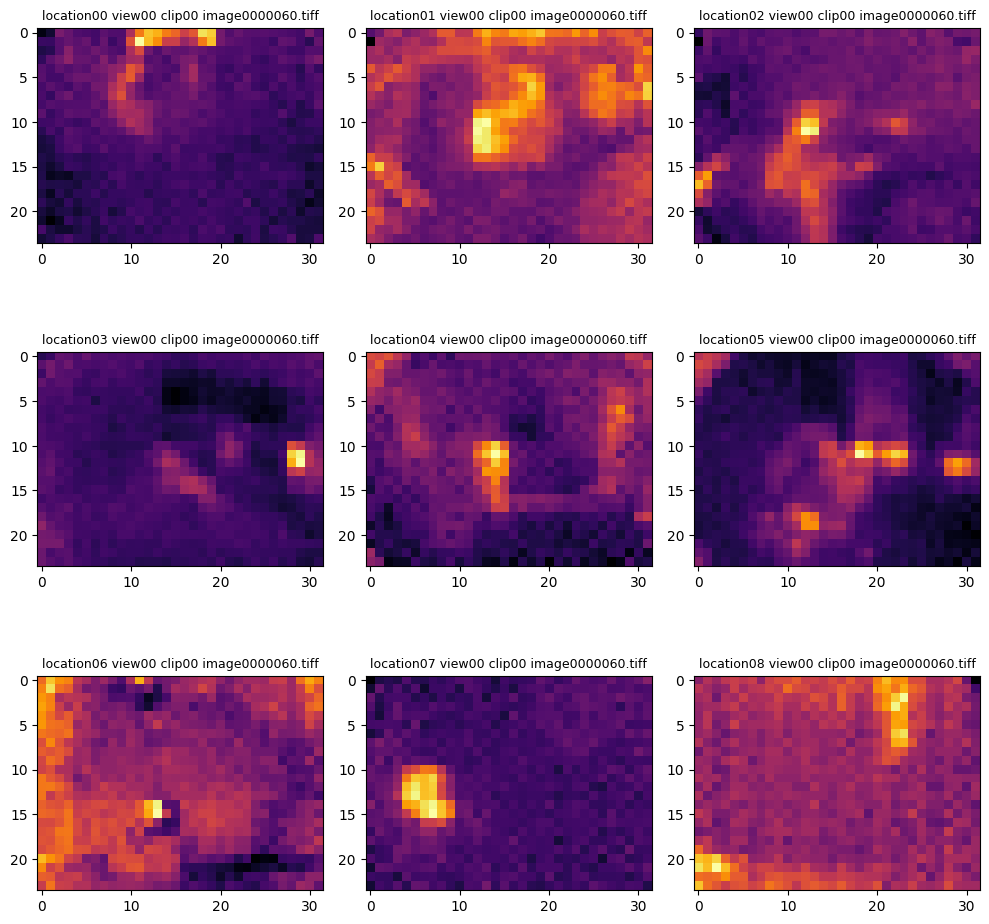

In [4]:

fig, axs = plt.subplots(3, 3, figsize=(10, 10))
axs = axs.flatten()                                

for i in range(9):
    img = cv.imread(f"/kaggle/input/mydata/publish/data/location0{i}/view00/clip00/image0000060.tiff", cv.IMREAD_UNCHANGED).astype(np.float32)

    img = img / 100.0
    img_norm = (img - img.min()) / (img.max() - img.min())
    axs[i].imshow(img_norm, cmap='inferno')
    axs[i].set_title(f"location0{i} view00 clip00 image0000060.tiff",size=9)
    axs[i].axis('on')

plt.tight_layout()
plt.show()

In [5]:
import numpy as np

def load_list(path):
    with open(path, "r") as f:
        return [line.strip() for line in f if line.strip()]

train_45 = "/kaggle/input/mydata/publish/meta_45/train.txt"
val_45   = "/kaggle/input/mydata/publish/meta_45/val.txt"
test_45  = "/kaggle/input/mydata/publish/meta_45/test.txt"

train_90 = "/kaggle/input/mydata/publish/meta_90/train.txt"
val_90   = "/kaggle/input/mydata/publish/meta_90/val.txt"
test_90  = "/kaggle/input/mydata/publish/meta_90/test.txt"

train_clips_45 = load_list(train_45)
val_clips_45   = load_list(val_45)
test_clips_45  = load_list(test_45)

train_clips_90 = load_list(train_90)
val_clips_90   = load_list(val_90)
test_clips_90  = load_list(test_90)

train_clips = train_clips_45 + train_clips_90
val_clips   = val_clips_45   + val_clips_90
test_clips  = test_clips_45  + test_clips_90

print("Train clips:", len(train_clips),np.array(train_clips).shape)
print("Val clips:", len(val_clips), np.array(val_clips).shape)
print("Test clips:", len(test_clips), np.array(test_clips).shape)


Train clips: 246 (246,)
Val clips: 21 (21,)
Test clips: 6 (6,)


In [6]:
import os
import glob
import cv2
import numpy as np

ROOT = "/kaggle/input/mydata/publish/"

def mylabler(clip_list):
    data = []
    labels = []

    for clip in clip_list:
        clip_path = os.path.join(ROOT, clip)

        gt_path = os.path.join(clip_path, "gt.txt")
        frame_boxes = {}

        if os.path.exists(gt_path):
            with open(gt_path, "r") as f:
                for line in f:
                    p = line.strip().split(',')
                    frame_idx = int(p[0])    
                    frame_boxes[frame_idx] = 1 

        img_files = sorted(glob.glob(os.path.join(clip_path, "*.tiff")))

        for img_path in img_files:
            img_name = os.path.basename(img_path)
            frame_id = int(img_name.replace("image","").replace(".tiff",""))

            img = cv2.imread(img_path, cv2.IMREAD_UNCHANGED).astype(np.float32)
            img = img / 100.0
            # flat = img.flatten()
            data.append(img)

            label = 1 if frame_id in frame_boxes else 0
            labels.append(label)

    return np.array(data, dtype=np.float32), np.array(labels, dtype=np.int32)
    
train, y_train = mylabler(train_clips)
val,   y_val   = mylabler(val_clips)
test,  y_test  = mylabler(test_clips)

print("Train X:", train.shape, " Train y:", y_train.shape)
print("Val   X:", val.shape,   " Val y:",   y_val.shape)
print("Test  X:", test.shape,  " Test y:",  y_test.shape)

print("Example:", train[0].shape, y_train[0])


Train X: (107232, 24, 32)  Train y: (107232,)
Val   X: (10317, 24, 32)  Val y: (10317,)
Test  X: (14304, 24, 32)  Test y: (14304,)
Example: (24, 32) 0


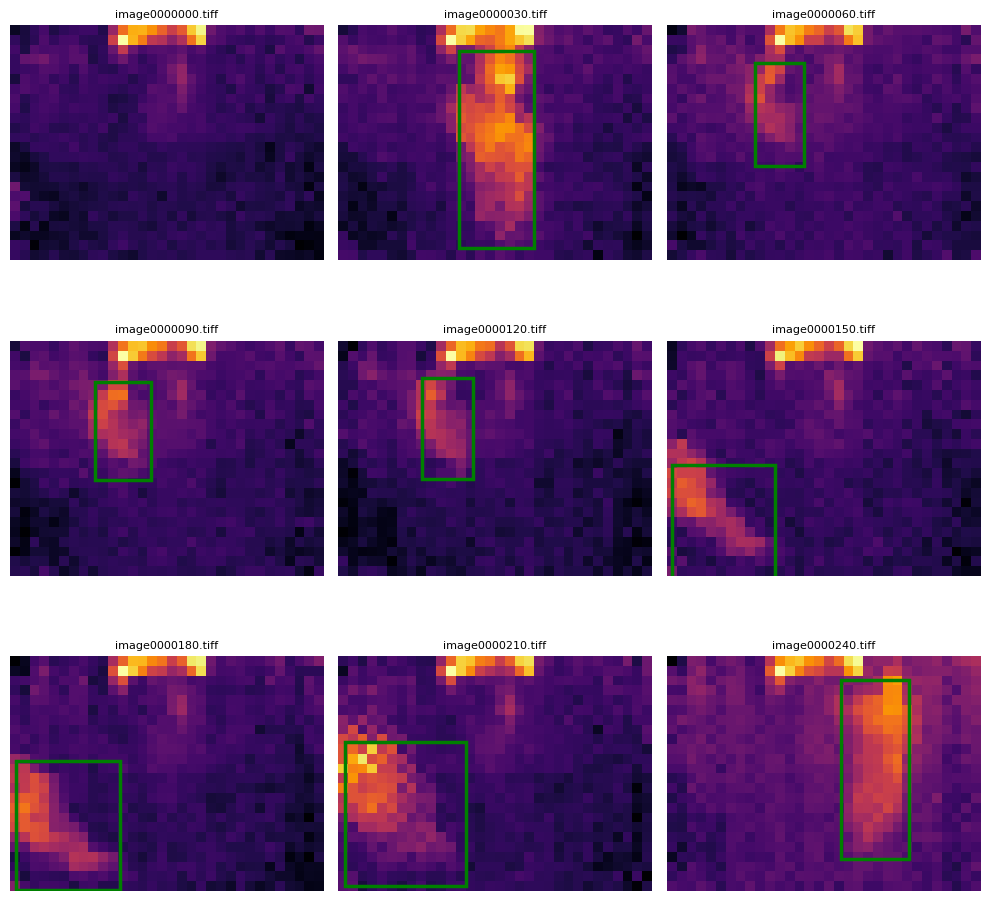

In [7]:
def load_gt(gt_path):
    boxes = {}
    if os.path.exists(gt_path):
        for l in open(gt_path):
            f, _, x, y, w, h = l.strip().split(",")[:6]
            boxes.setdefault(int(f), []).append([float(x), float(y), float(w), float(h)])
    return boxes
    
clip = "data/location00/view00/clip00"
path = f"/kaggle/input/mydata/publish/{clip}"
gt = load_gt(f"{path}/gt.txt")

fig, axs = plt.subplots(3, 3, figsize=(10,10))
for i, ax in enumerate(axs.flatten()):
    frame = i * 30
    img_path = f"{path}/image{frame:07d}.tiff"

    img = cv2.imread(img_path, -1).astype(np.float32) / 100.0
    img = (img - img.min()) / (img.max() - img.min())
    ax.imshow(img, cmap="inferno")
    for x, y, w, h in gt.get(frame, []):
        ax.add_patch(plt.Rectangle((x,y), w,h, fill=False, edgecolor="green", linewidth=2.5))


    ax.set_title(f"image{frame:07d}.tiff", fontsize=8)
    ax.axis("off")

plt.tight_layout()
plt.show()

### Model Implementtation

In [8]:
from torchvision.models import mobilenet_v2
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision.models import resnet50

import timm

class TinyCNN(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = nn.Conv2d(1, 32, 3, padding=1)
        self.conv2 = nn.Conv2d(32, 64, 3, padding=1)
        self.conv3 = nn.Conv2d(64, 128, 3, padding=1)
        self.pool = nn.MaxPool2d(2)
        self.gap = nn.AdaptiveAvgPool2d(1)
        self.fc = nn.Linear(128, 1)

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))   # (32, 12, 16)
        x = self.pool(F.relu(self.conv2(x)))   # (64, 6, 8)
        x = F.relu(self.conv3(x))              # (128, 6, 8)
        x = self.gap(x)                        # (128, 1, 1)
        x = x.view(x.size(0), -1)              # (128,)
        return torch.sigmoid(self.fc(x))       # (batch, 1)


class MobileNetV2(nn.Module):
    def __init__(self):
        super().__init__()
        self.base = mobilenet_v2(weights=None)
        
        # modify input layer to accept 1 channel
        self.base.features[0][0] = nn.Conv2d(1, 32, 3, stride=2, padding=1, bias=False)
        
        # classifier head: 1280 → 1
        self.base.classifier = nn.Sequential(
            nn.Linear(1280, 1)
        )

    def forward(self, x):
        x = self.base(x)
        return torch.sigmoid(x)

class EfficientNetB0(nn.Module):
    def __init__(self):
        super().__init__()
        self.base = timm.create_model(
            'efficientnet_b0',
            pretrained=False,
            in_chans=1,
            num_classes=1
        )

    def forward(self, x):
        return torch.sigmoid(self.base(x))

class ResNet50(nn.Module):
    def __init__(self):
        super().__init__()
        self.base = resnet50(weights=None)
        
        # modify first conv (3→1 channel)
        self.base.conv1 = nn.Conv2d(
            1, 64, kernel_size=7, stride=2, padding=3, bias=False
        )
        
        # replace classifier (2048→1)
        self.base.fc = nn.Linear(2048, 1)

    def forward(self, x):
        return torch.sigmoid(self.base(x))



/usr/local/lib/python3.11/dist-packages/pydantic/_internal/_generate_schema.py:2249: UnsupportedFieldAttributeWarning: The 'repr' attribute with value False was provided to the `Field()` function, which has no effect in the context it was used. 'repr' is field-specific metadata, and can only be attached to a model field using `Annotated` metadata or by assignment. This may have happened because an `Annotated` type alias using the `type` statement was used, or if the `Field()` function was attached to a single member of a union type.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/pydantic/_internal/_generate_schema.py:2249: UnsupportedFieldAttributeWarning: The 'frozen' attribute with value True was provided to the `Field()` function, which has no effect in the context it was used. 'frozen' is field-specific metadata, and can only be attached to a model field using `Annotated` metadata or by assignment. This may have happened because an `Annotated` type alias using the `type` 

In [9]:
import torch
from torchsummary import summary

device = "cuda" if torch.cuda.is_available() else "cpu"

m1 = TinyCNN().to(device)
m2 = MobileNetV2().to(device)
m3 = EfficientNetB0().to(device)
m4 = ResNet50().to(device)

print("\n=== TinyCNN ===")
summary(m1, (1, 24, 32))

print("\n=== MobileNetV2 ===")
summary(m2, (1, 24, 32))

print("\n=== EfficientNetB0 ===")
summary(m3, (1, 24, 32))

print("\n=== ResNet50 ===")
summary(m4, (1, 24, 32))



=== TinyCNN ===
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 32, 24, 32]             320
         MaxPool2d-2           [-1, 32, 12, 16]               0
            Conv2d-3           [-1, 64, 12, 16]          18,496
         MaxPool2d-4             [-1, 64, 6, 8]               0
            Conv2d-5            [-1, 128, 6, 8]          73,856
 AdaptiveAvgPool2d-6            [-1, 128, 1, 1]               0
            Linear-7                    [-1, 1]             129
Total params: 92,801
Trainable params: 92,801
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.00
Forward/backward pass size (MB): 0.40
Params size (MB): 0.35
Estimated Total Size (MB): 0.76
----------------------------------------------------------------

=== MobileNetV2 ===
----------------------------------------------------------------
     

In [10]:
import torch
from torch.utils.data import TensorDataset, DataLoader

# add channel dimension correctly
train_pt = torch.tensor(train[:, None, :, :], dtype=torch.float32)  # (N,1,24,32)
val_pt   = torch.tensor(val[:, None, :, :],   dtype=torch.float32)
test_pt  = torch.tensor(test[:, None, :, :],  dtype=torch.float32)

y_train_pt = torch.tensor(y_train, dtype=torch.float32).unsqueeze(1)
y_val_pt   = torch.tensor(y_val,   dtype=torch.float32).unsqueeze(1)
y_test_pt  = torch.tensor(y_test,  dtype=torch.float32).unsqueeze(1)

train_loader = DataLoader(TensorDataset(train_pt, y_train_pt), batch_size=256, shuffle=True)
val_loader   = DataLoader(TensorDataset(val_pt,   y_val_pt),   batch_size=256)
test_loader  = DataLoader(TensorDataset(test_pt,  y_test_pt),  batch_size=256)

print("Data transformation complete.")
print("train_pt shape:", train_pt.shape)
print("val_pt shape:", val_pt.shape)
print("test_pt shape:", test_pt.shape)


Data transformation complete.
train_pt shape: torch.Size([107232, 1, 24, 32])
val_pt shape: torch.Size([10317, 1, 24, 32])
test_pt shape: torch.Size([14304, 1, 24, 32])


In [11]:
import torch.nn as nn
import torch.optim as optim

def train_one_model(model, train_loader, val_loader, epochs=5):
    model = model.to(device)
    criterion = nn.BCELoss()
    optimizer = optim.Adam(model.parameters(), lr=1e-3)

    history = {"train_loss": [], "val_loss": [], "val_acc": []}

    for ep in range(epochs):
        model.train()
        total_loss = 0
        
        for xb, yb in train_loader:
            xb, yb = xb.to(device), yb.to(device)

            optimizer.zero_grad()
            pred = model(xb)
            loss = criterion(pred, yb)
            loss.backward()
            optimizer.step()

            total_loss += loss.item()

        # validation
        model.eval()
        val_loss, correct, total = 0, 0, 0
        
        with torch.no_grad():
            for xb, yb in val_loader:
                xb, yb = xb.to(device), yb.to(device)
                pred = model(xb)
                val_loss += criterion(pred, yb).item()
                correct += ((pred > 0.5).float() == yb).sum().item()
                total += yb.size(0)

        val_acc = correct / total

        print(f"Epoch {ep+1}/{epochs} | "
              f"Train Loss: {total_loss/len(train_loader):.4f} | "
              f"Val Loss: {val_loss/len(val_loader):.4f} | "
              f"Val Acc: {val_acc:.4f}")

        history["train_loss"].append(total_loss/len(train_loader))
        history["val_loss"].append(val_loss/len(val_loader))
        history["val_acc"].append(val_acc)

    return model, history


### Training Moel

In [12]:
results = {}

print("Training TinyCNN...")
tiny_model, tiny_hist = train_one_model(m1, train_loader, val_loader, epochs=500)
results["TinyCNN"] = tiny_hist

Training TinyCNN...
Epoch 1/500 | Train Loss: 0.1372 | Val Loss: 0.1603 | Val Acc: 0.9600
Epoch 2/500 | Train Loss: 0.1344 | Val Loss: 0.1574 | Val Acc: 0.9600
Epoch 3/500 | Train Loss: 0.1338 | Val Loss: 0.1636 | Val Acc: 0.9600
Epoch 4/500 | Train Loss: 0.1228 | Val Loss: 0.1358 | Val Acc: 0.9600
Epoch 5/500 | Train Loss: 0.1009 | Val Loss: 0.1360 | Val Acc: 0.9600
Epoch 6/500 | Train Loss: 0.0811 | Val Loss: 0.1459 | Val Acc: 0.9600
Epoch 7/500 | Train Loss: 0.0679 | Val Loss: 0.1568 | Val Acc: 0.9600
Epoch 8/500 | Train Loss: 0.0629 | Val Loss: 0.1772 | Val Acc: 0.9571
Epoch 9/500 | Train Loss: 0.0594 | Val Loss: 0.1853 | Val Acc: 0.9591
Epoch 10/500 | Train Loss: 0.0542 | Val Loss: 0.1731 | Val Acc: 0.9574
Epoch 11/500 | Train Loss: 0.0524 | Val Loss: 0.1936 | Val Acc: 0.9511
Epoch 12/500 | Train Loss: 0.0497 | Val Loss: 0.1936 | Val Acc: 0.9559
Epoch 13/500 | Train Loss: 0.0484 | Val Loss: 0.1979 | Val Acc: 0.9559
Epoch 14/500 | Train Loss: 0.0459 | Val Loss: 0.2108 | Val Acc: 0.

In [13]:
print("\nTraining MobileNetV2...")
mobilenet_model, mobilenet_hist = train_one_model(m2, train_loader, val_loader, epochs=500)
results["MobileNetV2"] = mobilenet_hist


Training MobileNetV2...
Epoch 1/500 | Train Loss: 0.0663 | Val Loss: 0.2055 | Val Acc: 0.9598
Epoch 2/500 | Train Loss: 0.0420 | Val Loss: 0.2280 | Val Acc: 0.9586
Epoch 3/500 | Train Loss: 0.0372 | Val Loss: 0.2310 | Val Acc: 0.9600
Epoch 4/500 | Train Loss: 0.0319 | Val Loss: 0.2512 | Val Acc: 0.9600
Epoch 5/500 | Train Loss: 0.0301 | Val Loss: 0.2186 | Val Acc: 0.9599
Epoch 6/500 | Train Loss: 0.0286 | Val Loss: 0.2105 | Val Acc: 0.9600
Epoch 7/500 | Train Loss: 0.0292 | Val Loss: 0.2997 | Val Acc: 0.9600
Epoch 8/500 | Train Loss: 0.0267 | Val Loss: 0.2760 | Val Acc: 0.9600
Epoch 9/500 | Train Loss: 0.0264 | Val Loss: 0.2545 | Val Acc: 0.9571
Epoch 10/500 | Train Loss: 0.0306 | Val Loss: 0.2388 | Val Acc: 0.9600
Epoch 11/500 | Train Loss: 0.0267 | Val Loss: 0.2596 | Val Acc: 0.9600
Epoch 12/500 | Train Loss: 0.0262 | Val Loss: 0.2191 | Val Acc: 0.9600
Epoch 13/500 | Train Loss: 0.0243 | Val Loss: 0.2283 | Val Acc: 0.9598
Epoch 14/500 | Train Loss: 0.0244 | Val Loss: 0.2694 | Val Ac

In [14]:
print("\nTraining EfficientNetB0...")
effnet_model, effnet_hist = train_one_model(m3, train_loader, val_loader, epochs=100)
results["EfficientNetB0"] = effnet_hist


Training EfficientNetB0...
Epoch 1/100 | Train Loss: 0.6024 | Val Loss: 0.1474 | Val Acc: 0.9600
Epoch 2/100 | Train Loss: 0.0958 | Val Loss: 0.1599 | Val Acc: 0.9600
Epoch 3/100 | Train Loss: 0.0653 | Val Loss: 0.1595 | Val Acc: 0.9600
Epoch 4/100 | Train Loss: 0.0585 | Val Loss: 0.2056 | Val Acc: 0.9600
Epoch 5/100 | Train Loss: 0.0523 | Val Loss: 0.1278 | Val Acc: 0.9596
Epoch 6/100 | Train Loss: 0.0480 | Val Loss: 0.1498 | Val Acc: 0.9600
Epoch 7/100 | Train Loss: 0.0426 | Val Loss: 0.1647 | Val Acc: 0.9576
Epoch 8/100 | Train Loss: 0.0410 | Val Loss: 0.1817 | Val Acc: 0.9600
Epoch 9/100 | Train Loss: 0.0405 | Val Loss: 0.1266 | Val Acc: 0.9574
Epoch 10/100 | Train Loss: 0.0397 | Val Loss: 0.1677 | Val Acc: 0.9600
Epoch 11/100 | Train Loss: 0.0379 | Val Loss: 0.1686 | Val Acc: 0.9570
Epoch 12/100 | Train Loss: 0.0339 | Val Loss: 0.1418 | Val Acc: 0.9600
Epoch 13/100 | Train Loss: 0.0323 | Val Loss: 0.1852 | Val Acc: 0.9590
Epoch 14/100 | Train Loss: 0.0269 | Val Loss: 0.2431 | Val

In [15]:
print("\nTraining ResNet50...")
resnet_model, resnet_hist = train_one_model(m4, train_loader, val_loader, epochs=100)
results["ResNet50"] = resnet_hist


Training ResNet50...
Epoch 1/100 | Train Loss: 0.0993 | Val Loss: 0.1092 | Val Acc: 0.9573
Epoch 2/100 | Train Loss: 0.0592 | Val Loss: 0.1100 | Val Acc: 0.9599
Epoch 3/100 | Train Loss: 0.0479 | Val Loss: 0.2462 | Val Acc: 0.9600
Epoch 4/100 | Train Loss: 0.0425 | Val Loss: 0.1922 | Val Acc: 0.9546
Epoch 5/100 | Train Loss: 0.0400 | Val Loss: 0.5625 | Val Acc: 0.7444
Epoch 6/100 | Train Loss: 0.0398 | Val Loss: 0.2245 | Val Acc: 0.9600
Epoch 7/100 | Train Loss: 0.0364 | Val Loss: 0.2163 | Val Acc: 0.9600
Epoch 8/100 | Train Loss: 0.0357 | Val Loss: 0.5765 | Val Acc: 0.7009
Epoch 9/100 | Train Loss: 0.0373 | Val Loss: 0.2537 | Val Acc: 0.9600
Epoch 10/100 | Train Loss: 0.0360 | Val Loss: 0.2795 | Val Acc: 0.9078
Epoch 11/100 | Train Loss: 0.0567 | Val Loss: 0.3724 | Val Acc: 0.9600
Epoch 12/100 | Train Loss: 0.0550 | Val Loss: 0.2520 | Val Acc: 0.9419
Epoch 13/100 | Train Loss: 0.0445 | Val Loss: 0.3187 | Val Acc: 0.8603
Epoch 14/100 | Train Loss: 0.0343 | Val Loss: 0.2405 | Val Acc: 

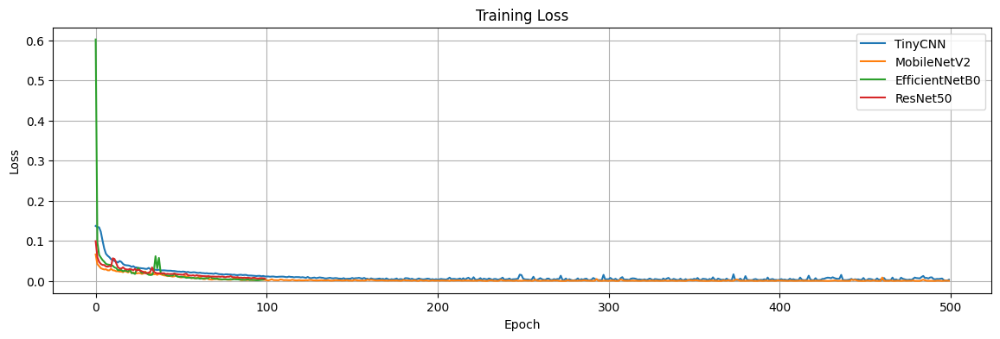

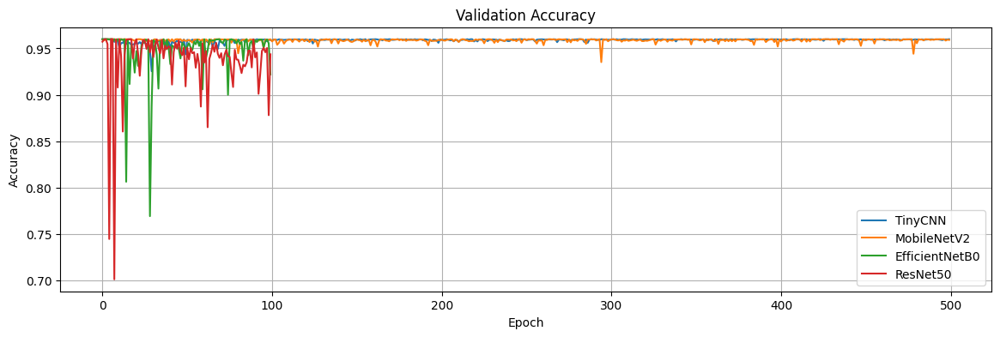

In [16]:

epochs = len(next(iter(results.values()))["train_loss"])

plt.figure(figsize=(14, 4))
for name, hist in results.items():
    plt.plot(hist["train_loss"], label=name)
plt.title("Training Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.grid(True)
plt.show()
    
plt.figure(figsize=(14, 4))
for name, hist in results.items():
    plt.plot(hist["val_acc"], label=name)
plt.title("Validation Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()
plt.grid(True)
plt.show()

In [23]:
def test_accuracy(model, loader):
    model.eval()
    correct = 0
    total = 0

    with torch.no_grad():
        for X, y in loader:
            X = X.to(device)
            y = y.to(device)

            pred = model(X)
            pred_label = (pred > 0.5).float()

            correct += (pred_label == y).sum().item()
            total   += y.size(0)

    return correct / total


print("TinyCNN Accuracy       =", test_accuracy(tiny_model, test_loader))
print("MobileNetV2 Accuracy   =", test_accuracy(mobilenet_model, test_loader))
print("EfficientNetB0 Accuracy=", test_accuracy(effnet_model, test_loader))
print("ResNet50 Accuracy      =", test_accuracy(resnet_model, test_loader))


TinyCNN Accuracy       = 0.9460290827740492
MobileNetV2 Accuracy   = 0.92792225950783
EfficientNetB0 Accuracy= 0.8807326621923938
ResNet50 Accuracy      = 0.9265240492170023


In [26]:
bench = BenchX(batch_size=256, runs=1, device="cpu")

bench.benchmark(tiny_model,name="TinyCNN",framework="pytorch",input_shape=(1,24,32))
bench.benchmark(mobilenet_model,name="MobileNetV2",framework="pytorch",input_shape=(1,24,32))
bench.benchmark(effnet_model,name="EfficientNetB0",framework="pytorch",input_shape=(1,24,32))
bench.benchmark(resnet_model,name="ResNet50",framework="pytorch",input_shape=(1,24,32))

bench.summary()


,Model,Framework,Device,Latency_ms,Throughput_sps,Memory_MB,Memory_Bytes,Params_M,Memory
0,MobileNetV2,PyTorch,cpu,78.97,3242,54.0,56664064,2.22,54.04 MB
1,TinyCNN,PyTorch,cpu,82.44,3105,6.1,6361088,0.09,6.07 MB
2,ResNet50,PyTorch,cpu,411.40,622,90.4,94801668,23.50,90.41 MB
3,EfficientNetB0,PyTorch,cpu,617.97,414,41.5,43532288,4.01,41.52 MB


In [25]:
bench = BenchX(batch_size=256, runs=1, device="cuda")

bench.benchmark(tiny_model,name="TinyCNN",framework="pytorch",input_shape=(1,24,32))
bench.benchmark(mobilenet_model,name="MobileNetV2",framework="pytorch",input_shape=(1,24,32))
bench.benchmark(effnet_model,name="EfficientNetB0",framework="pytorch",input_shape=(1,24,32))
bench.benchmark(resnet_model,name="ResNet50",framework="pytorch",input_shape=(1,24,32))

bench.summary()


,Model,Framework,Device,Latency_ms,Throughput_sps,Memory_MB,Memory_Bytes,Params_M,Memory
0,TinyCNN,PyTorch,cuda,1.90,134524,443.4,464931840,0.09,443.39 MB
1,MobileNetV2,PyTorch,cuda,11.89,21535,435.2,456363008,2.22,435.22 MB
2,EfficientNetB0,PyTorch,cuda,15.38,16646,441.2,462654464,4.01,441.22 MB
3,ResNet50,PyTorch,cuda,28.14,9097,435.1,456281088,23.50,435.14 MB


In [27]:
torch.save(tiny_model, "TinyCNN_full.pth")
torch.save(mobilenet_model, "MobileNetV2_full.pth")
torch.save(effnet_model, "EfficientNetB0_full.pth")
torch.save(resnet_model, "ResNet50_full.pth")

print("All full models saved!")


All full models saved!
